In [ ]:
import pandas as pd

In [ ]:
! wget "https://www.dropbox.com/s/wsmlthhri29fb79/spcup_2022_unseen.zip?dl=1" -c -O "spcup-2022_unseen.zip" 

In [ ]:
!unzip "./spcup-2022_unseen.zip" -d "./spcup_2022_unseen/"

In [ ]:
! find "./spcup_2022_unseen/" -type f | wc -l

1699


In [ ]:
df1 = pd.read_csv('./spcup_2022_unseen/spcup_2022_unseen/labels.csv')

In [ ]:
df1.head()

,track,algorithm
0,7b0f8df28f98bdcd65e48d4799c1f98f.wav,5
1,211fbbdb342c2bbbac43fd4c908e239a.wav,5
2,807587f93df68fd50120fa1f3684b5ec.wav,5
3,78724d807be41abdd1a4d661d6535d1f.wav,5
4,86195fbf1d21aeeb9a956e56dd88f1b6.wav,5


In [ ]:
df1.shape

(1000, 2)

***

In [ ]:
! wget "https://www.dropbox.com/s/ftkyvwxgr9wl7jf/spcup_2022_eval_part1.zip?dl=1" -c -O "./spcup_2022_eval_part1.zip"
! unzip "./spcup_2022_eval_part1.zip" -d "./spcup_2022_eval_part1/"

In [ ]:
! find "./spcup_2022_eval_part1/" -type f | wc -l

9235


In [ ]:
! find "./spcup_2022_eval_part1/spcup_2022_eval_part1" -type f | sed -e 's/.*\.//' | sed -e 's/.*\///' | sort -u

csv
wav


In [ ]:
! find "./spcup_2022_eval_part1/spcup_2022_eval_part1" -type f -name "*.csv"

./spcup_2022_eval_part1/spcup_2022_eval_part1/labels_eval_part1.csv


In [ ]:
df2 = pd.read_csv('./spcup_2022_eval_part1/spcup_2022_eval_part1/labels_eval_part1.csv')
df2.head()

,Unnamed: 0,track
0,0,f14498230d583796987a2e9576695384.wav
1,1,2eb02f5f517ad346de780b22535824c0.wav
2,2,d14d2f68081e6969b65e30bdb9d67144.wav
3,3,40b86c3ca31ddb5ea16639e1229b8a7c.wav
4,4,193eb4a1f4028c84d26e36ef74593fa4.wav


In [ ]:
! wget "https://www.dropbox.com/s/zylz07o2z0x308g/spcup_2022_eval_part2.zip?dl=1" -c -O "./spcup_2022_eval_part2.zip"
! unzip "./spcup_2022_eval_part2.zip" -d "./spcup_2022_eval_part2/"

--2022-03-09 16:30:22--  https://codalab.lisn.upsaclay.fr/competitions/2577?secret_key=5e44bf0e-f481-47e3-9df9-95e73016f625
Resolving codalab.lisn.upsaclay.fr (codalab.lisn.upsaclay.fr)... 129.175.8.8
Connecting to codalab.lisn.upsaclay.fr (codalab.lisn.upsaclay.fr)|129.175.8.8|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 28227 (28K) [text/html]
Saving to: ‘./test_data.zip’

./test_data.zip     100%[===================>]  27.57K  --.-KB/s    in 0s      

2022-03-09 16:30:23 (225 MB/s) - ‘./test_data.zip’ saved [28227/28227]



Archive:  ./test_data.zip
  End-of-central-directory signature not found.  Either this file is not
  a zipfile, or it constitutes one disk of a multi-part archive.  In the
  latter case the central directory and zipfile comment will be found on
  the last disk(s) of this archive.
unzip:  cannot find zipfile directory in one of ./test_data.zip or
        ./test_data.zip.zip, and cannot find ./test_data.zip.ZIP, period.


Set Torch audio augmentation pipeline

In [ ]:
# optional - if you want support for mp3, flac and ogg files
! apt-get install libsox-fmt-all
# install the sox command line tool
! apt-get install sox
# install pysox
! pip install sox

In [ ]:
import math
import time
import sox
import random
import os
import requests

import torch
import torchaudio
import torchaudio.functional as F
import torchaudio.transforms as T
import librosa
import soundfile
import matplotlib.pyplot as plt  
import numpy as np
import pandas as pd
from IPython.display import Audio, display

In [ ]:
_SAMPLE_DIR = "_assets"
SAMPLE_RIR_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/VOiCES_devkit/distant-16k/room-response/rm1/impulse/Lab41-SRI-VOiCES-rm1-impulse-mc01-stu-clo.wav"  # noqa: E501
SAMPLE_RIR_PATH = os.path.join(_SAMPLE_DIR, "rir.wav")

SAMPLE_WAV_SPEECH_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/VOiCES_devkit/source-16k/train/sp0307/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav"  # noqa: E501
SAMPLE_WAV_SPEECH_PATH = os.path.join(_SAMPLE_DIR, "speech.wav")

SAMPLE_NOISE_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/VOiCES_devkit/distant-16k/distractors/rm1/babb/Lab41-SRI-VOiCES-rm1-babb-mc01-stu-clo.wav"  # noqa: E501
SAMPLE_NOISE_PATH = os.path.join(_SAMPLE_DIR, "bg.wav")

os.makedirs(_SAMPLE_DIR, exist_ok=True)

In [ ]:
def _fetch_data():
    uri = [
        (SAMPLE_RIR_URL, SAMPLE_RIR_PATH),
        (SAMPLE_WAV_SPEECH_URL, SAMPLE_WAV_SPEECH_PATH),
        (SAMPLE_NOISE_URL, SAMPLE_NOISE_PATH),
    ]
    for url, path in uri:
        with open(path, "wb") as file_:
            file_.write(requests.get(url).content)


_fetch_data()

In [ ]:
def _get_sample(path, resample=None):
    effects = [["remix", "1"]]
    if resample:
        effects.extend(
            [
                ["lowpass", f"{resample // 2}"],
                ["rate", f"{resample}"],
            ]
        )
    return torchaudio.sox_effects.apply_effects_file(path, effects=effects)

def get_noise_sample(*, resample=None):
    return _get_sample(SAMPLE_NOISE_PATH, resample=resample)

def add_SNR(signal, sr, snr_db, snr_noise):
    noise = torch.zeros(signal.shape).type(torch.float32)
    noise[:, :snr_noise.shape[1]] = snr_noise
    signal = signal = signal.type(torch.float32)
    speech_power = signal.norm(p=2)
    noise_power = noise.norm(p=2)

    snr = math.exp(snr_db / 10)
    scale = snr * noise_power / speech_power
    return (scale * signal + noise) / 2

In [ ]:
noise, _ = get_noise_sample()


In [ ]:
def get_sample(path):
    effects = [["remix", "1"]]
    if random.choice([True, False]):
        print(1)
        effects.append(["lowpass", "-1", "300"])
    if random.choice([True, False]):
        print(2)
        effects.append(["rate", "8000"])
    if random.choice([True, False]):
        print(3)
        effects.append(["speed", "0.8"])
    if random.choice([True, False]):
        print(4)
        effects.append(["reverb", "-w"])

    ad_signal, sr = torchaudio.sox_effects.apply_effects_file(path, effects=effects, normalize=False)
    print(ad_signal.shape)
    if ad_signal.shape[0] == 2:
        ad_signal = ad_signal[1, :][None, :]
    noise, _ = get_noise_sample(resample=sr)
    print(noise.shape)
    if random.choice([True, False]):
        ad_signal = F.apply_codec(ad_signal, sr, format= "mp3", compression=-9)
    if random.choice([True, False]):
        ad_signal = add_SNR(ad_signal, sr, 3, noise)
    return ad_signal, sr

In [ ]:
def plot_waveform(waveform, sample_rate, title="Waveform", xlim=None, ylim=None):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sample_rate

    figure, axes = plt.subplots(num_channels, 1)
    if num_channels == 1:
        axes = [axes]
    for c in range(num_channels):
        axes[c].plot(time_axis, waveform[c], linewidth=1)
        axes[c].grid(True)
        if num_channels > 1:
            axes[c].set_ylabel(f"Channel {c+1}")
        if xlim:
            axes[c].set_xlim(xlim)
        if ylim:
            axes[c].set_ylim(ylim)
    figure.suptitle(title)
    plt.show(block=False)

def plot_specgram(waveform, sample_rate, title="Spectrogram", xlim=None):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape

    figure, axes = plt.subplots(num_channels, 1)
    if num_channels == 1:
        axes = [axes]
    for c in range(num_channels):
        axes[c].specgram(waveform[c], Fs=sample_rate)
        if num_channels > 1:
            axes[c].set_ylabel(f"Channel {c+1}")
        if xlim:
            axes[c].set_xlim(xlim)
    figure.suptitle(title)
    plt.show(block=False)

2
torch.Size([1, 44676])
torch.Size([1, 40000])


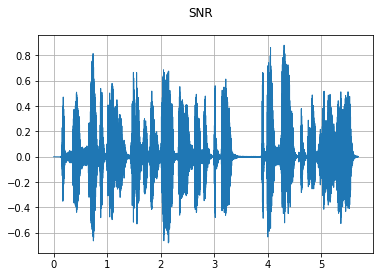

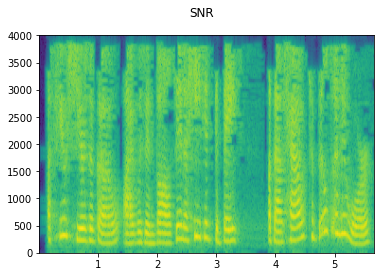

3
torch.Size([1, 89351])
torch.Size([1, 64000])


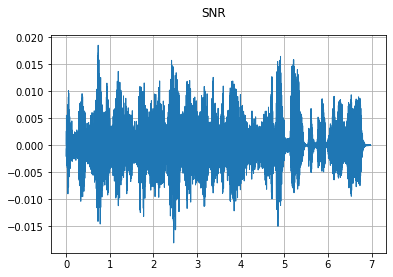

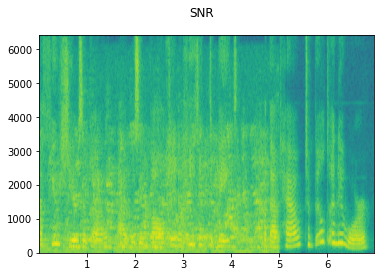

1
2
3
4
torch.Size([2, 44676])
torch.Size([1, 32000])


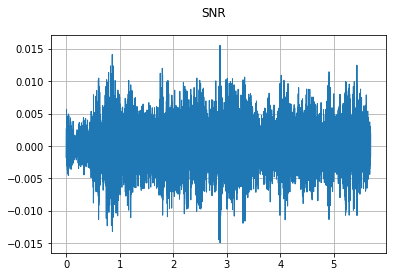

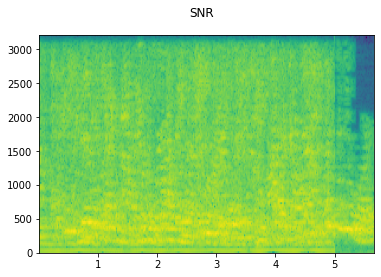

1
3
4
torch.Size([2, 89351])
torch.Size([1, 64000])


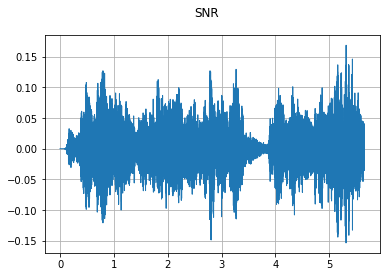

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


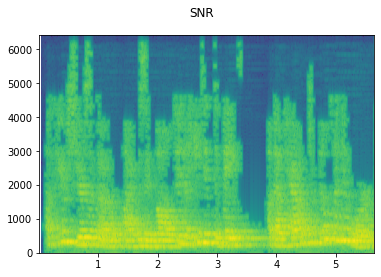

4
torch.Size([2, 89351])
torch.Size([1, 80000])


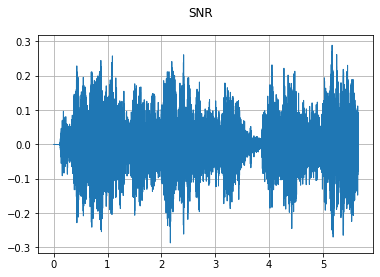

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


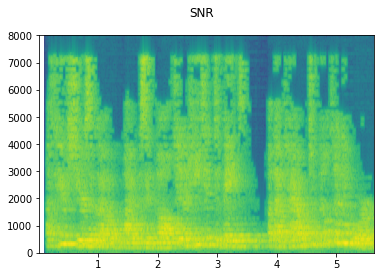

2
4
torch.Size([2, 44676])
torch.Size([1, 40000])


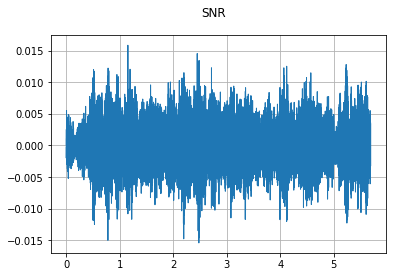

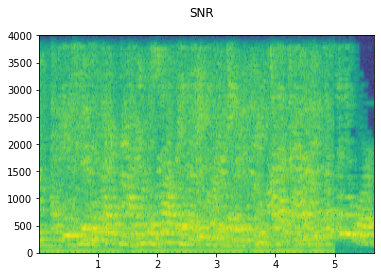

4
torch.Size([2, 89351])
torch.Size([1, 80000])


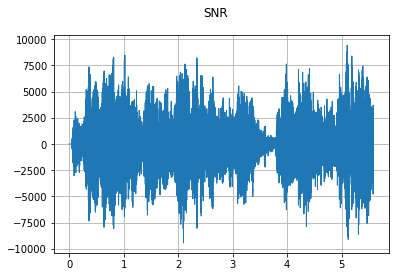

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


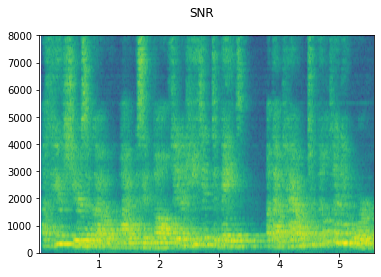

1
4
torch.Size([2, 89351])
torch.Size([1, 80000])


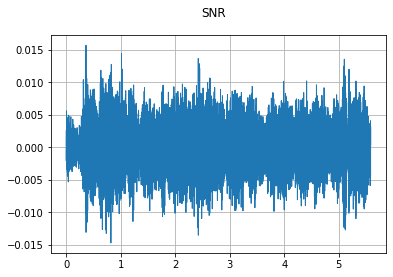

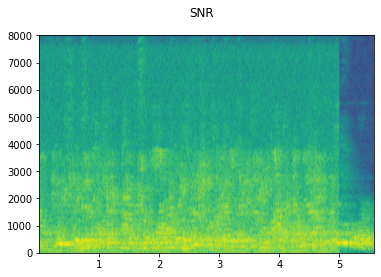

3
torch.Size([1, 89351])
torch.Size([1, 64000])


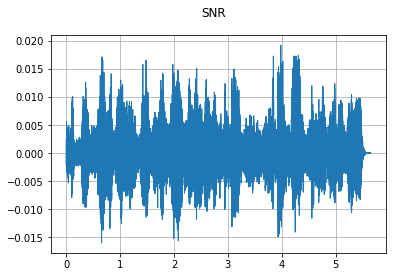

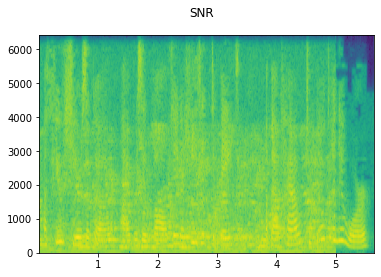

2
3
4
torch.Size([2, 44676])
torch.Size([1, 32000])


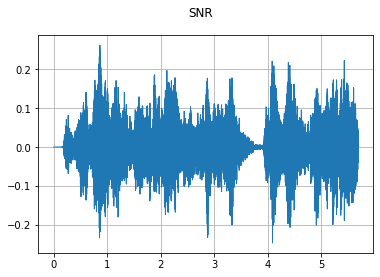

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


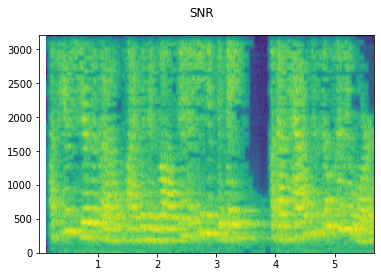

3
torch.Size([1, 89351])
torch.Size([1, 64000])


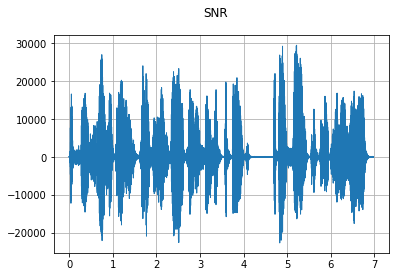

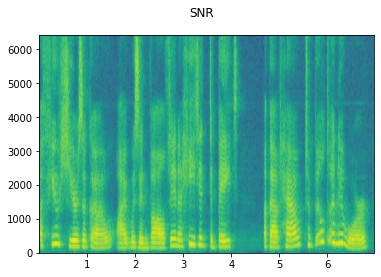

1
4
torch.Size([2, 89351])
torch.Size([1, 80000])


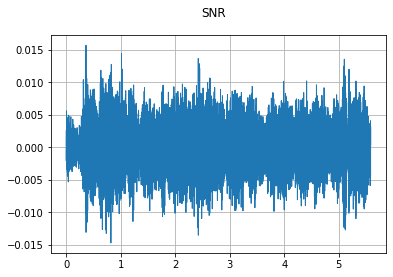

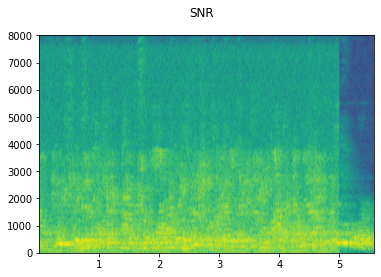

1
2
torch.Size([1, 44676])
torch.Size([1, 40000])


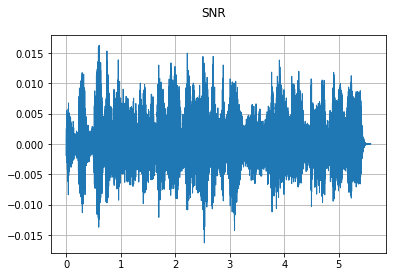

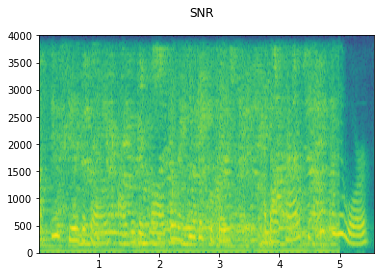

1
torch.Size([1, 89351])
torch.Size([1, 80000])


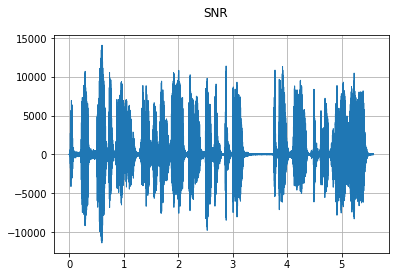

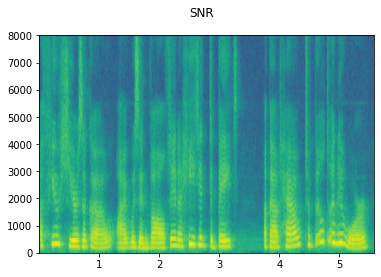

1
torch.Size([1, 89351])
torch.Size([1, 80000])


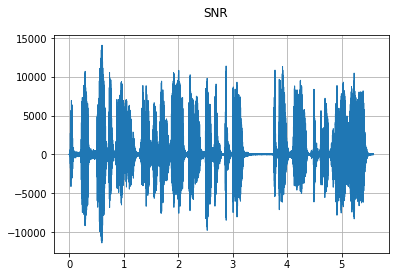

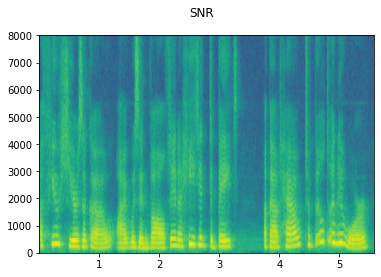

1
2
4
torch.Size([2, 44676])
torch.Size([1, 40000])


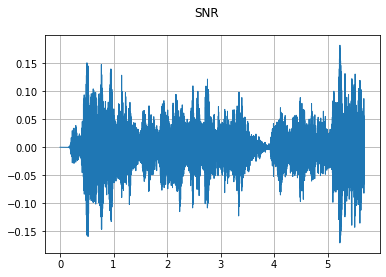

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


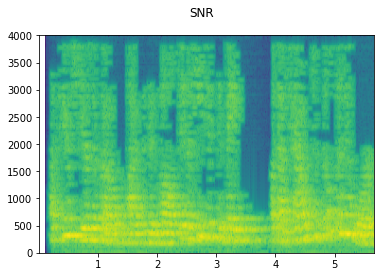

1
3
torch.Size([1, 89351])
torch.Size([1, 64000])


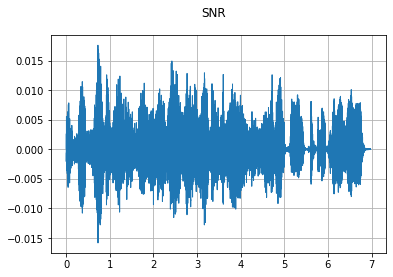

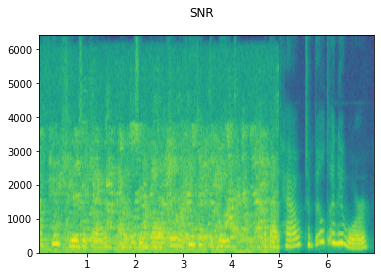

2
torch.Size([1, 44676])
torch.Size([1, 40000])


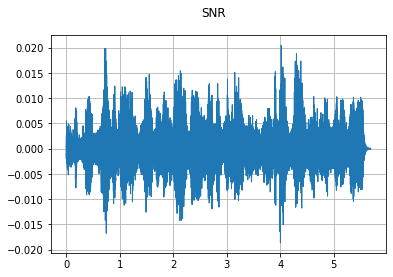

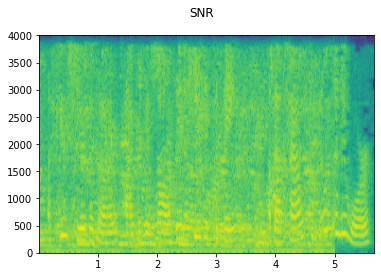

3
torch.Size([1, 89351])
torch.Size([1, 64000])


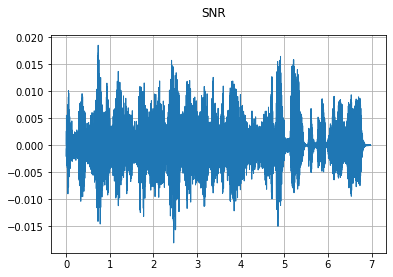

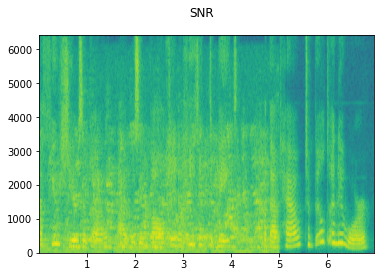

1
3
4
torch.Size([2, 89351])
torch.Size([1, 64000])


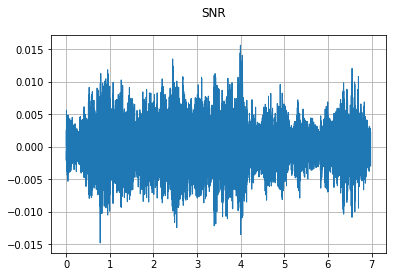

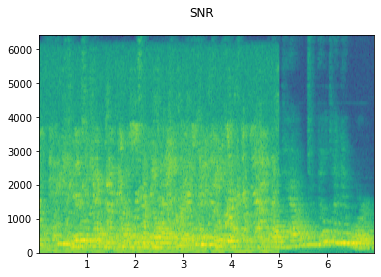

1
3
4
torch.Size([2, 89351])
torch.Size([1, 64000])


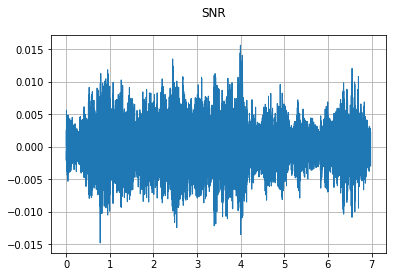

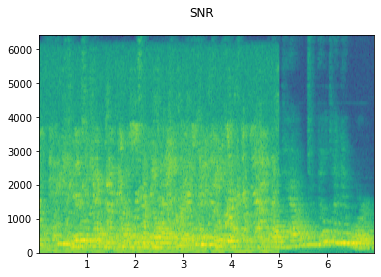

2
torch.Size([1, 44676])
torch.Size([1, 40000])


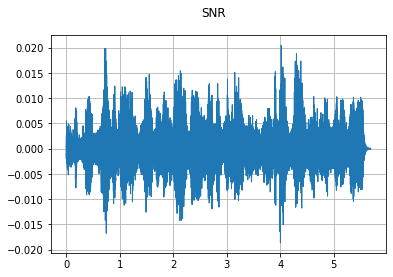

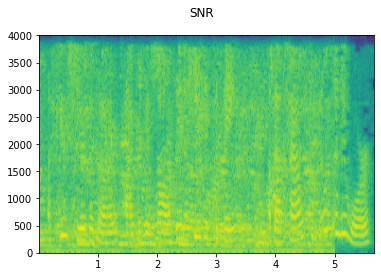

2
4
torch.Size([2, 44676])
torch.Size([1, 40000])


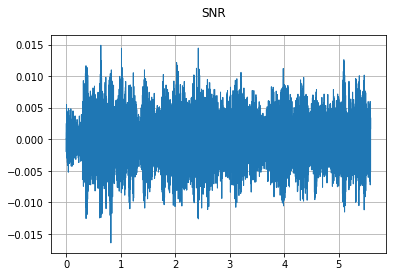

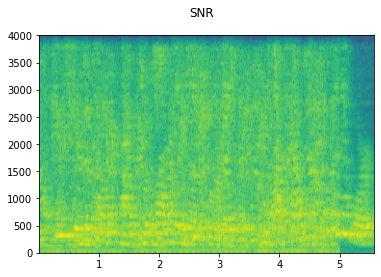

2
4
torch.Size([2, 44676])
torch.Size([1, 40000])


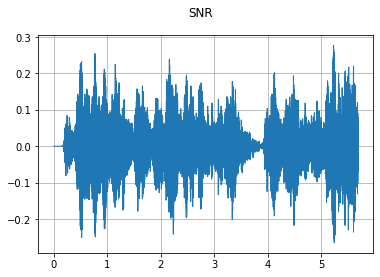

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


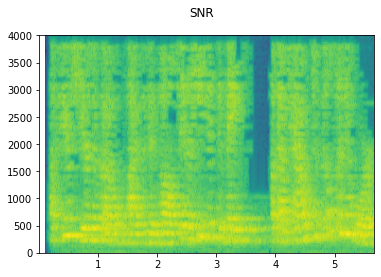

torch.Size([1, 89351])
torch.Size([1, 80000])


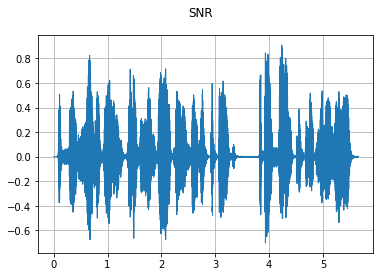

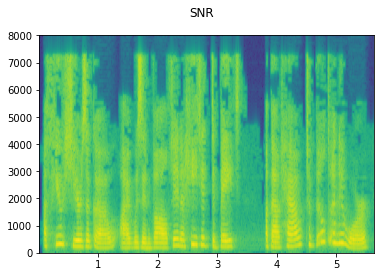

2
4
torch.Size([2, 44676])
torch.Size([1, 40000])


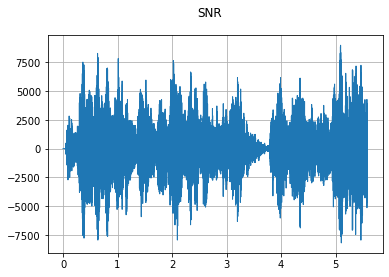

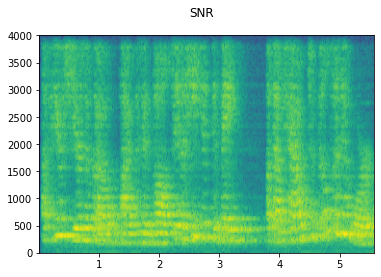

2
torch.Size([1, 44676])
torch.Size([1, 40000])


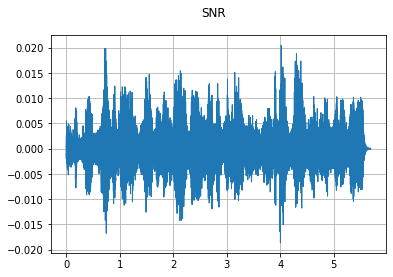

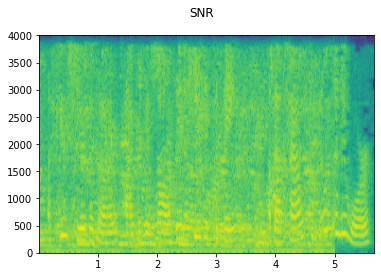

1
2
3
torch.Size([1, 44676])
torch.Size([1, 32000])


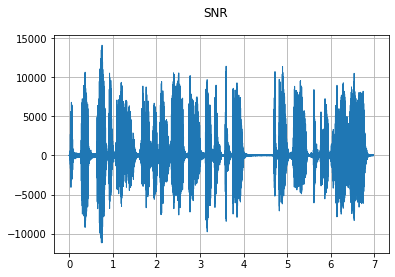

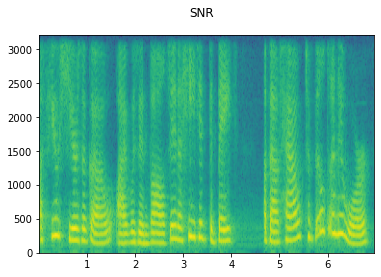

1
4
torch.Size([2, 89351])
torch.Size([1, 80000])


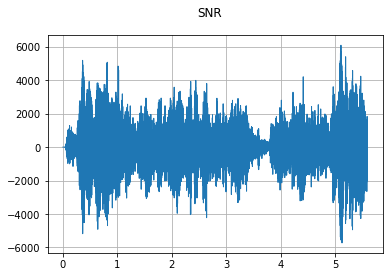

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


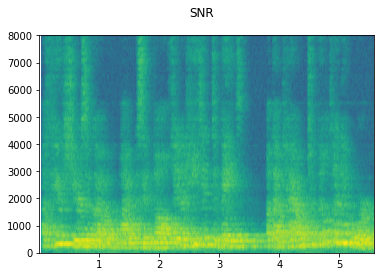

1
torch.Size([1, 89351])
torch.Size([1, 80000])


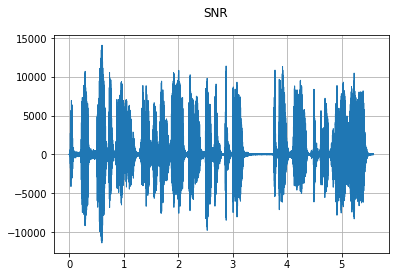

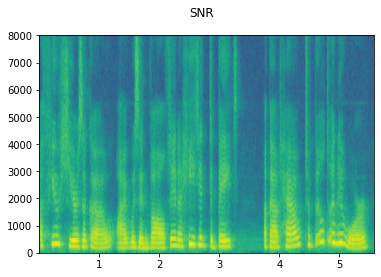

1
2
torch.Size([1, 44676])
torch.Size([1, 40000])


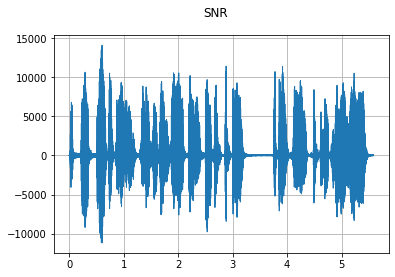

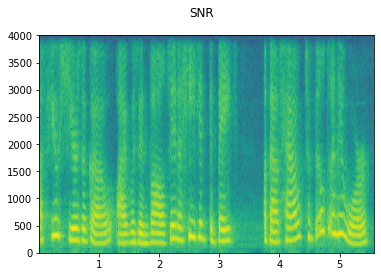

2
3
torch.Size([1, 44676])
torch.Size([1, 32000])


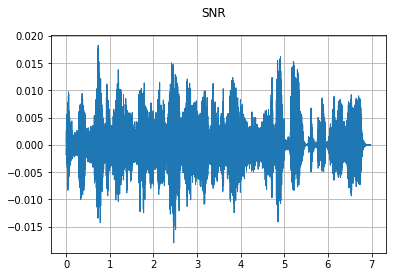

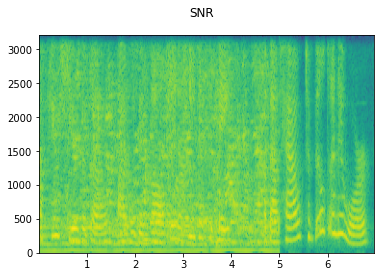

1
2
3
4
torch.Size([2, 44676])
torch.Size([1, 32000])


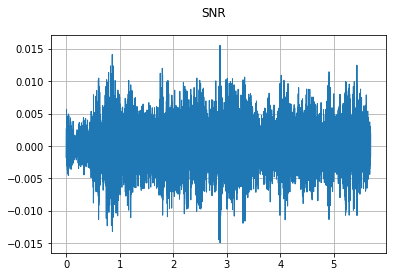

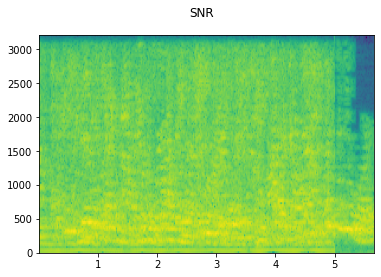

4
torch.Size([2, 89351])
torch.Size([1, 80000])


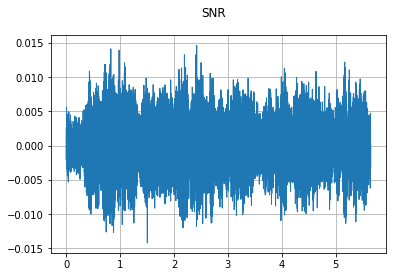

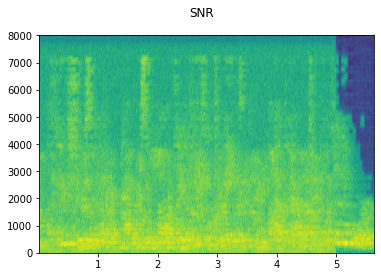

1
3
torch.Size([1, 89351])
torch.Size([1, 64000])


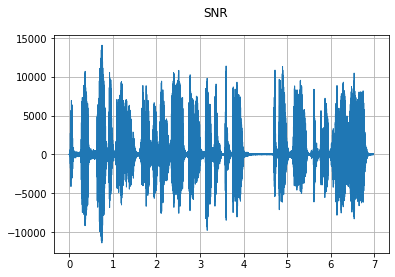

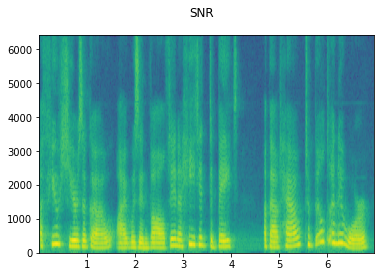

1
3
torch.Size([1, 89351])
torch.Size([1, 64000])


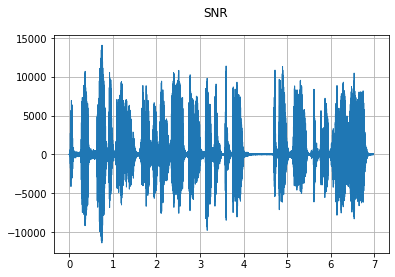

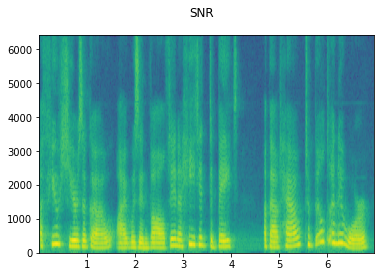

1
2
3
torch.Size([1, 44676])
torch.Size([1, 32000])


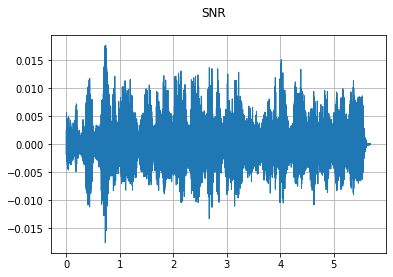

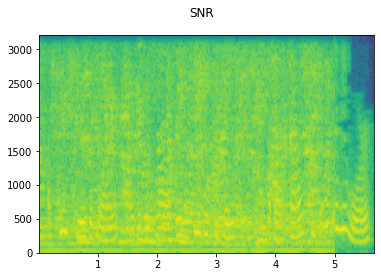

3
4
torch.Size([2, 89351])
torch.Size([1, 64000])


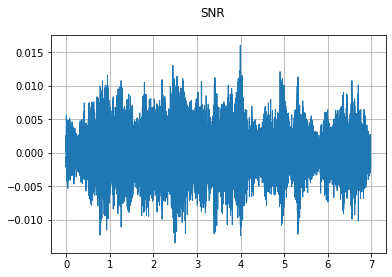

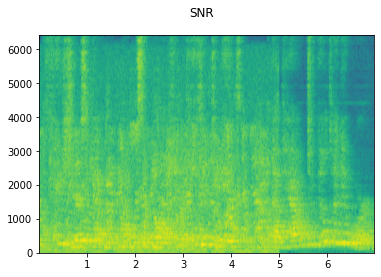

1
2
torch.Size([1, 44676])
torch.Size([1, 40000])


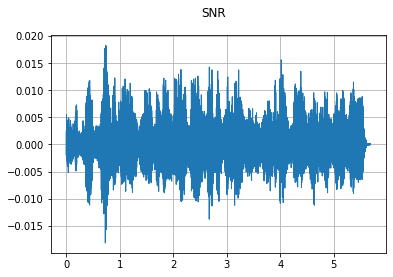

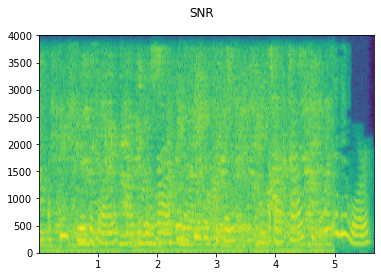

2
3
4
torch.Size([2, 44676])
torch.Size([1, 32000])


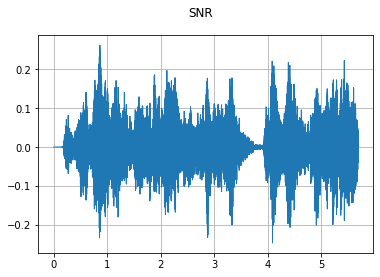

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


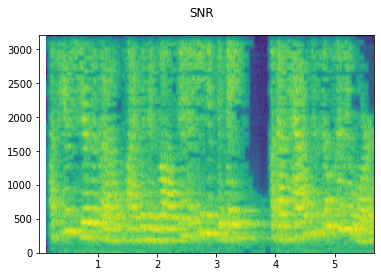

1
3
4
torch.Size([2, 89351])
torch.Size([1, 64000])


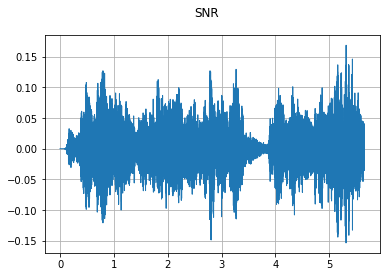

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


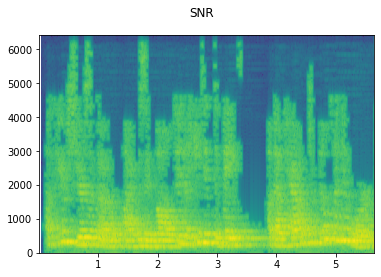

2
3
torch.Size([1, 44676])
torch.Size([1, 32000])


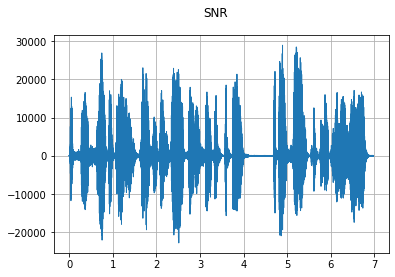

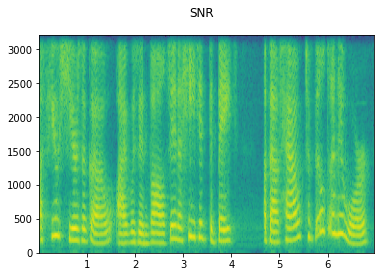

1
2
3
4
torch.Size([2, 44676])
torch.Size([1, 32000])


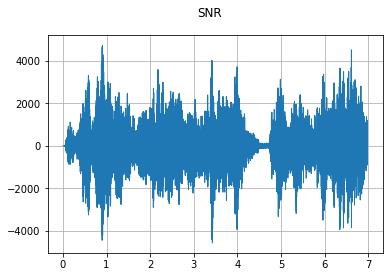

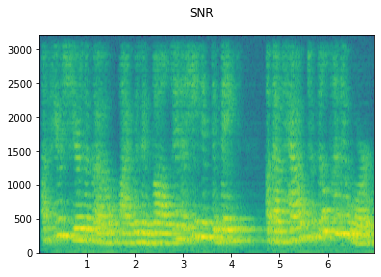

1
3
torch.Size([1, 89351])
torch.Size([1, 64000])


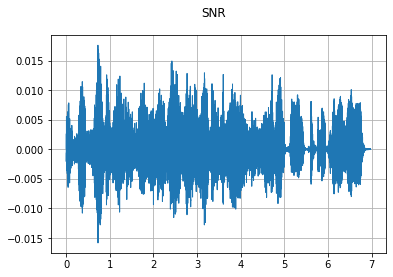

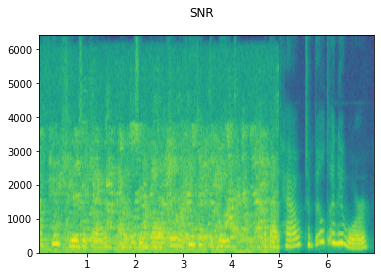

3
torch.Size([1, 89351])
torch.Size([1, 64000])


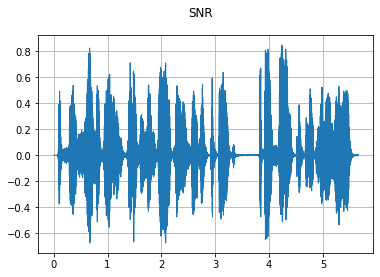

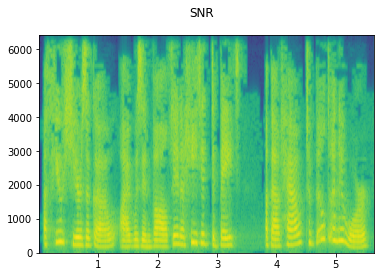

1
3
torch.Size([1, 89351])
torch.Size([1, 64000])


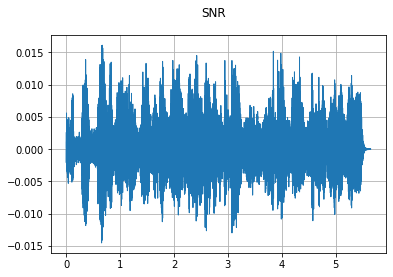

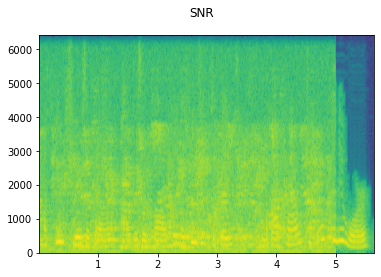

1
2
3
4
torch.Size([2, 44676])
torch.Size([1, 32000])


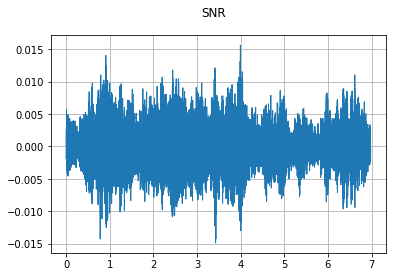

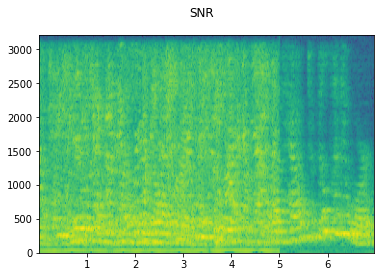

1
2
4
torch.Size([2, 44676])
torch.Size([1, 40000])


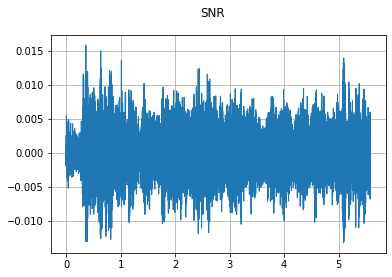

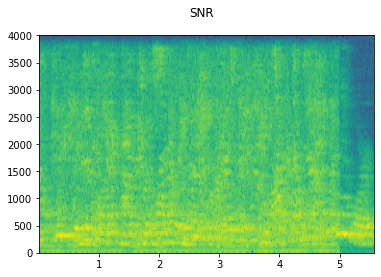

2
3
torch.Size([1, 44676])
torch.Size([1, 32000])


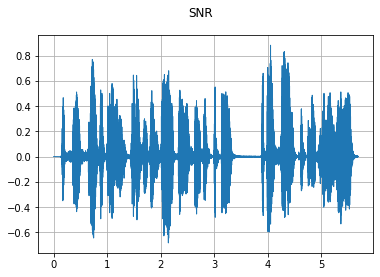

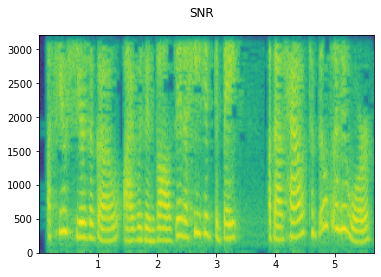

1
2
4
torch.Size([2, 44676])
torch.Size([1, 40000])


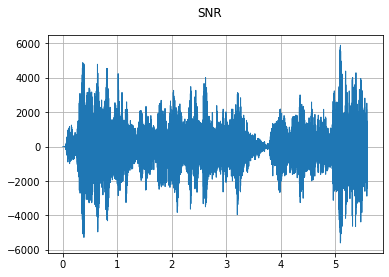

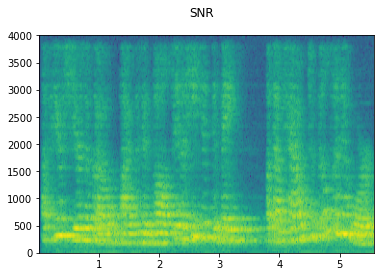

2
4
torch.Size([2, 44676])
torch.Size([1, 40000])


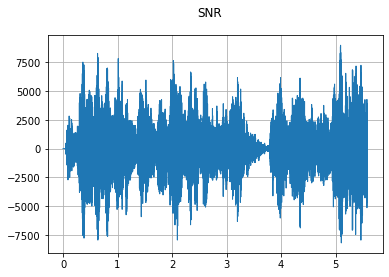

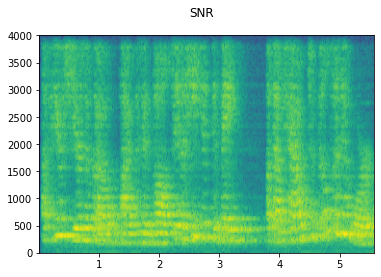

1
2
4
torch.Size([2, 44676])
torch.Size([1, 40000])


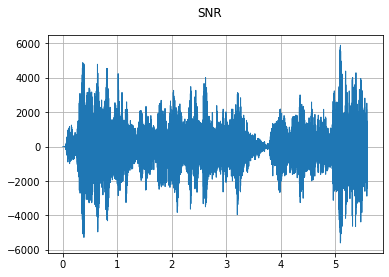

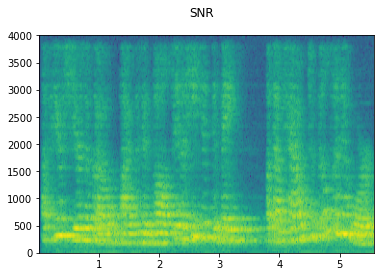

1
3
torch.Size([1, 89351])
torch.Size([1, 64000])


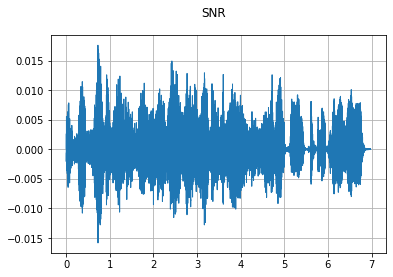

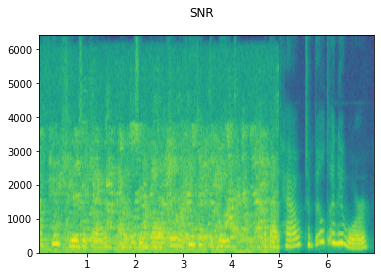

1
3
4
torch.Size([2, 89351])
torch.Size([1, 64000])


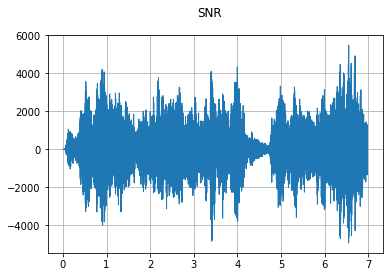

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


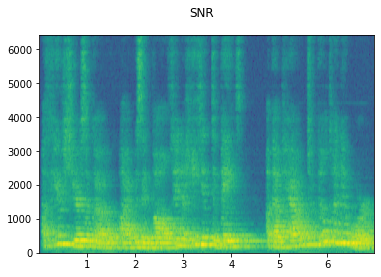

1
3
4
torch.Size([2, 89351])
torch.Size([1, 64000])


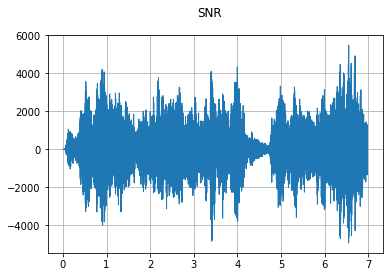

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


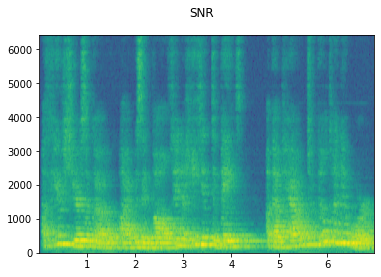

4
torch.Size([2, 89351])
torch.Size([1, 80000])


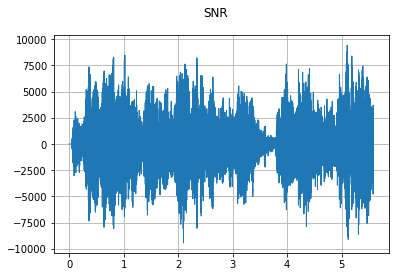

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


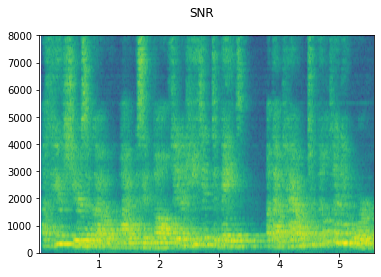

2
4
torch.Size([2, 44676])
torch.Size([1, 40000])


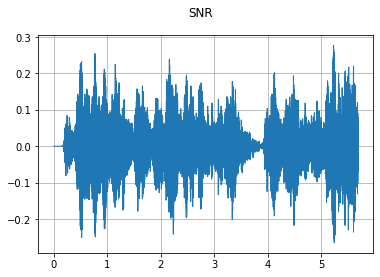

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


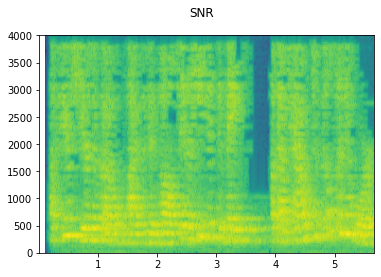

1
2
3
4
torch.Size([2, 44676])
torch.Size([1, 32000])


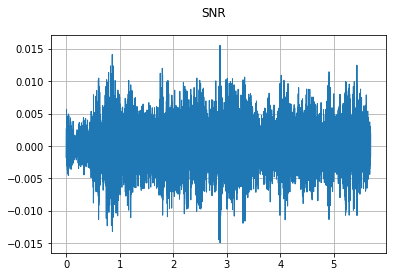

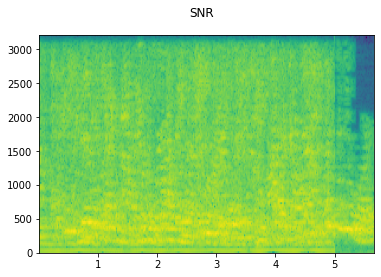

1
2
4
torch.Size([2, 44676])
torch.Size([1, 40000])


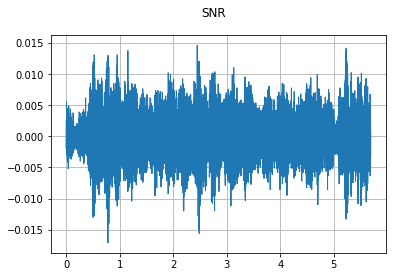

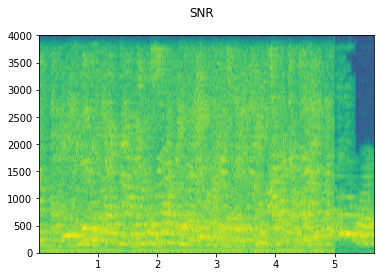

4
torch.Size([2, 89351])
torch.Size([1, 80000])


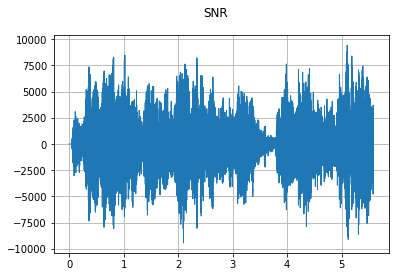

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


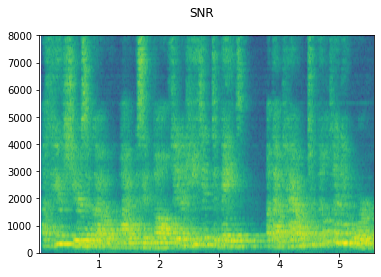

torch.Size([1, 89351])
torch.Size([1, 80000])


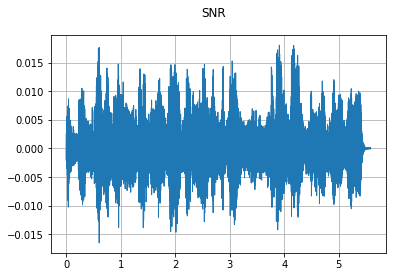

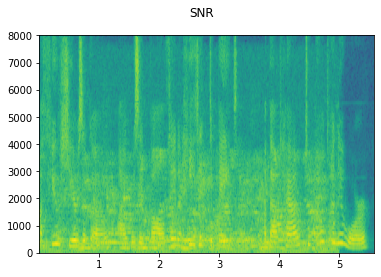

2
3
torch.Size([1, 44676])
torch.Size([1, 32000])


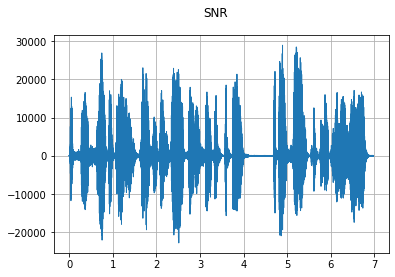

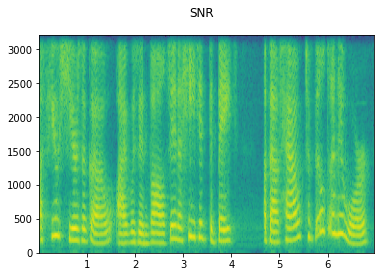

1
2
4
torch.Size([2, 44676])
torch.Size([1, 40000])


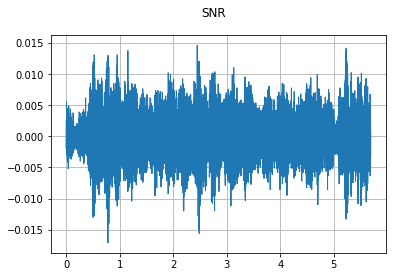

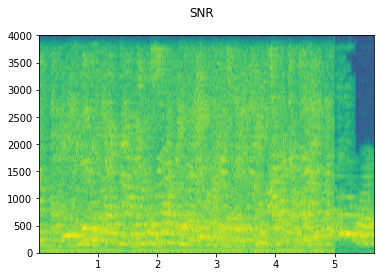

1
2
3
torch.Size([1, 44676])
torch.Size([1, 32000])


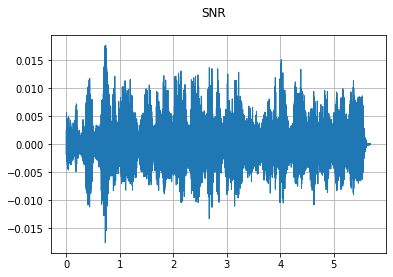

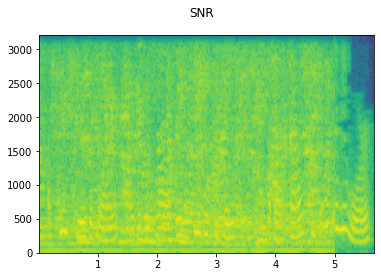

1
4
torch.Size([2, 89351])
torch.Size([1, 80000])


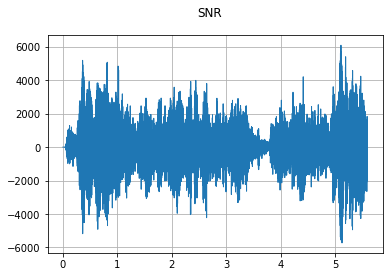

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


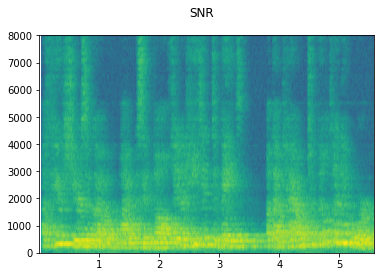

1
2
4
torch.Size([2, 44676])
torch.Size([1, 40000])


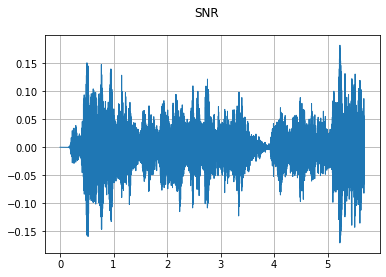

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


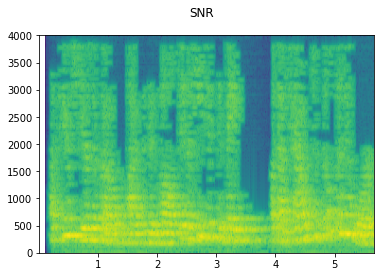

1
2
torch.Size([1, 44676])
torch.Size([1, 40000])


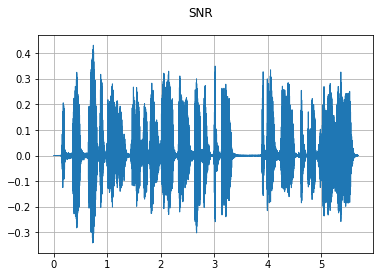

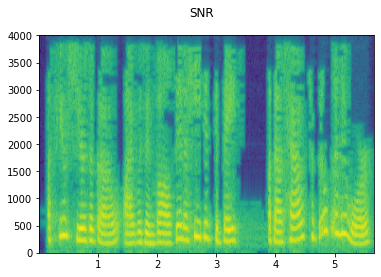

3
4
torch.Size([2, 89351])
torch.Size([1, 64000])


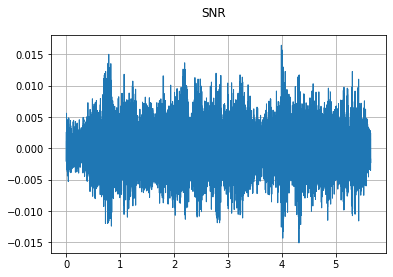

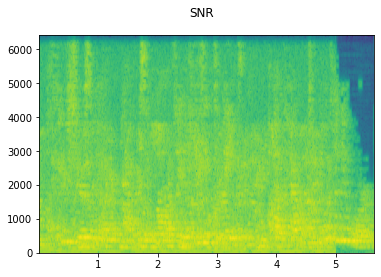

2
torch.Size([1, 44676])
torch.Size([1, 40000])


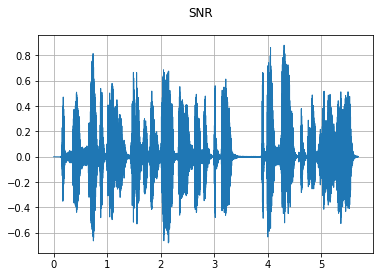

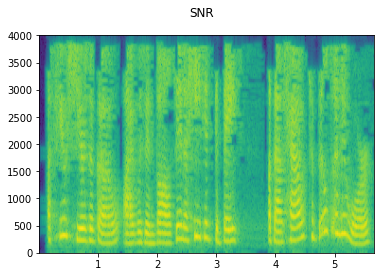

1
2
torch.Size([1, 44676])
torch.Size([1, 40000])


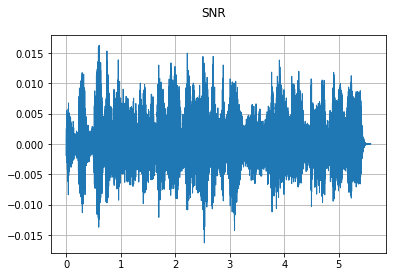

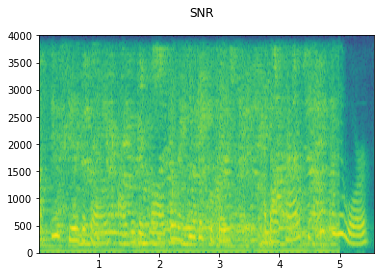

1
3
torch.Size([1, 89351])
torch.Size([1, 64000])


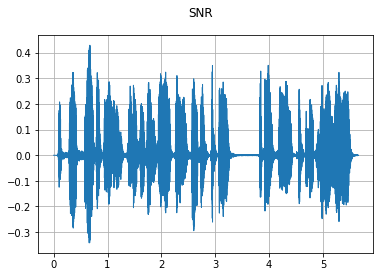

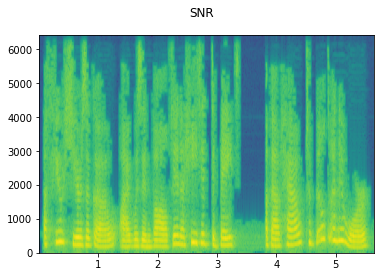

2
4
torch.Size([2, 44676])
torch.Size([1, 40000])


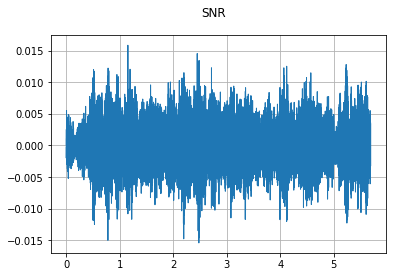

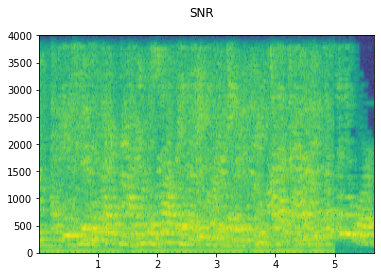

2
torch.Size([1, 44676])
torch.Size([1, 40000])


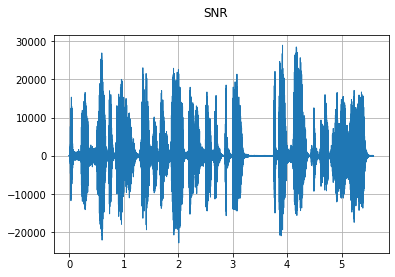

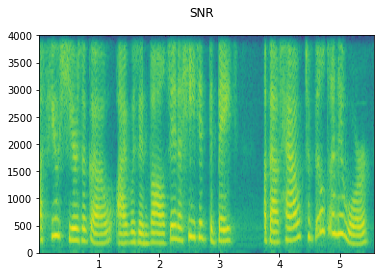

2
3
4
torch.Size([2, 44676])
torch.Size([1, 32000])


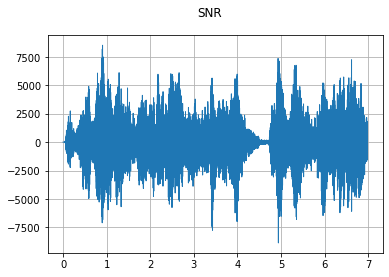

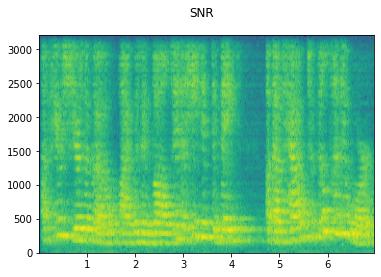

1
3
4
torch.Size([2, 89351])
torch.Size([1, 64000])


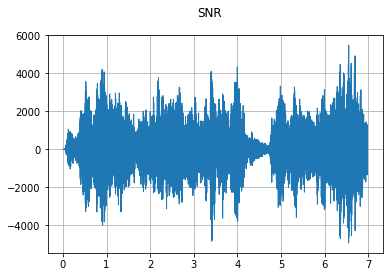

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


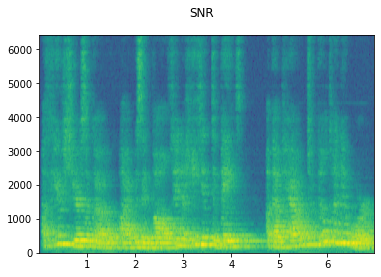

1
2
3
4
torch.Size([2, 44676])
torch.Size([1, 32000])


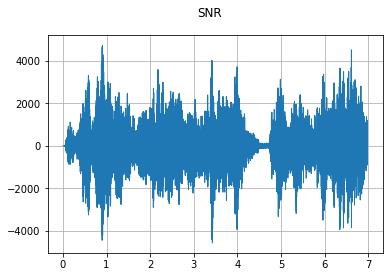

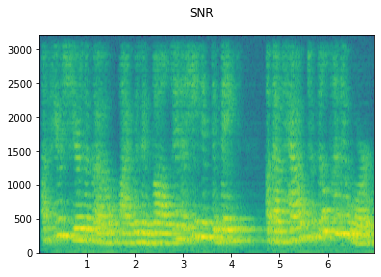

3
torch.Size([1, 89351])
torch.Size([1, 64000])


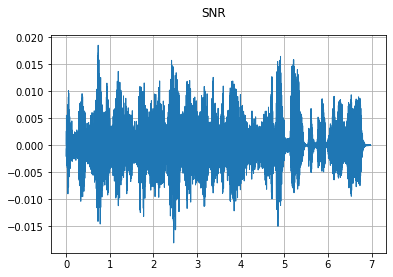

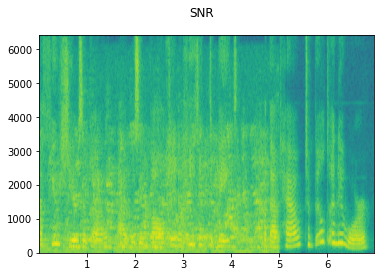

3
4
torch.Size([2, 89351])
torch.Size([1, 64000])


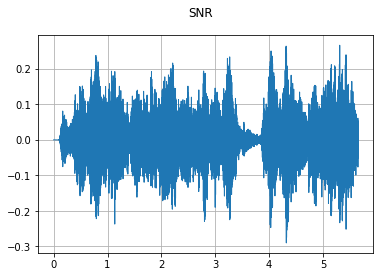

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


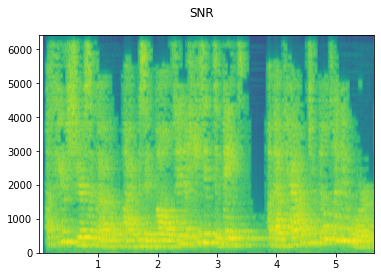

1
2
3
4
torch.Size([2, 44676])
torch.Size([1, 32000])


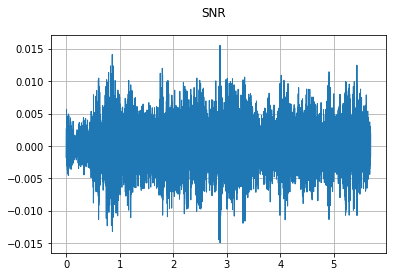

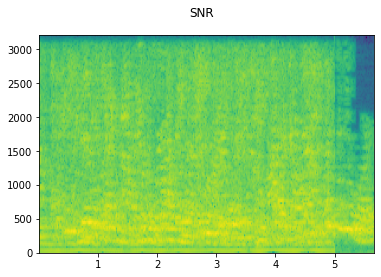

1
torch.Size([1, 89351])
torch.Size([1, 80000])


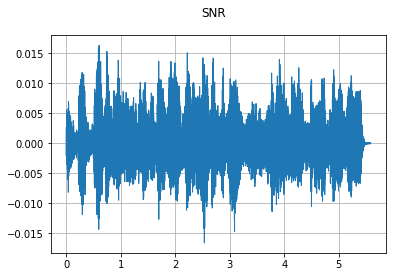

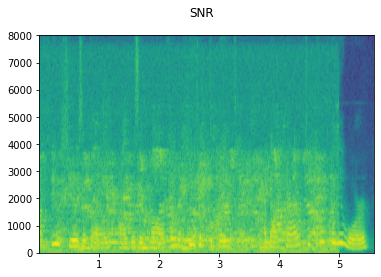

1
2
4
torch.Size([2, 44676])
torch.Size([1, 40000])


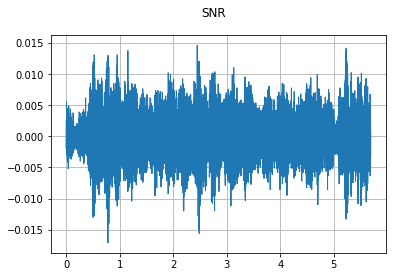

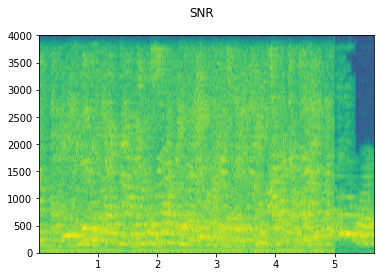

1
3
4
torch.Size([2, 89351])
torch.Size([1, 64000])


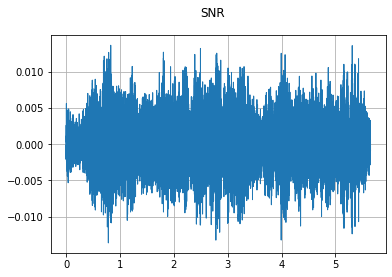

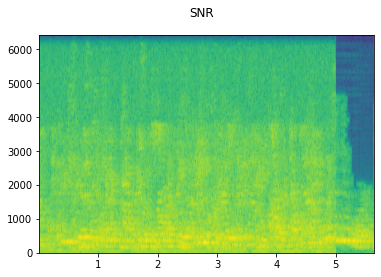

2
torch.Size([1, 44676])
torch.Size([1, 40000])


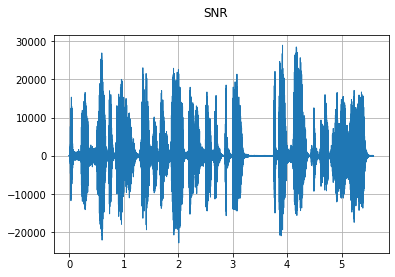

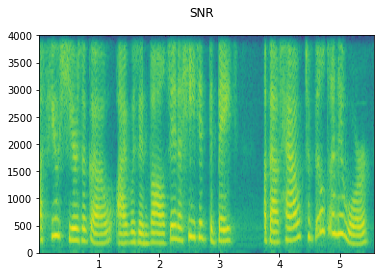

1
2
4
torch.Size([2, 44676])
torch.Size([1, 40000])


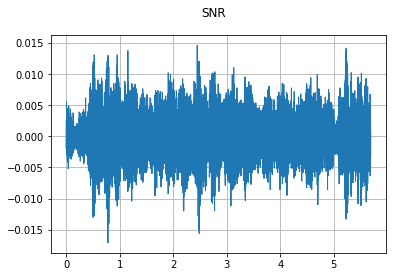

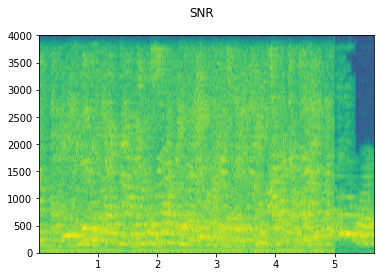

torch.Size([1, 89351])
torch.Size([1, 80000])


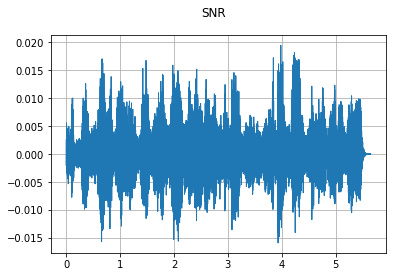

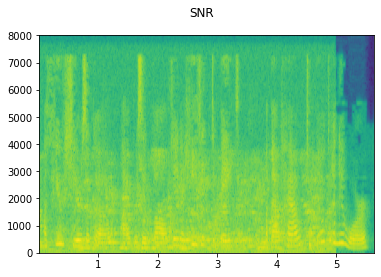

1
2
3
torch.Size([1, 44676])
torch.Size([1, 32000])


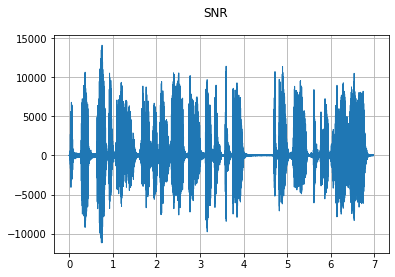

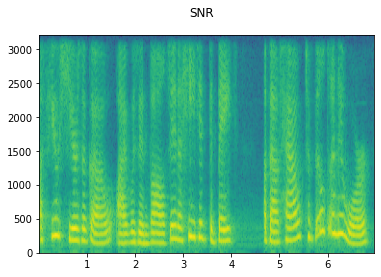

1
3
torch.Size([1, 89351])
torch.Size([1, 64000])


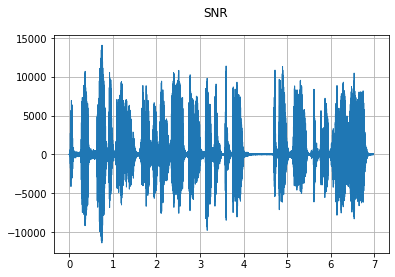

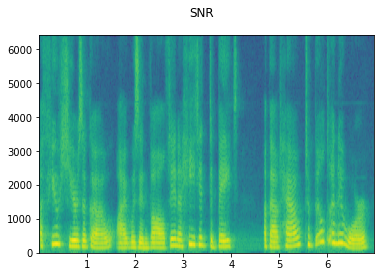

1
2
torch.Size([1, 44676])
torch.Size([1, 40000])


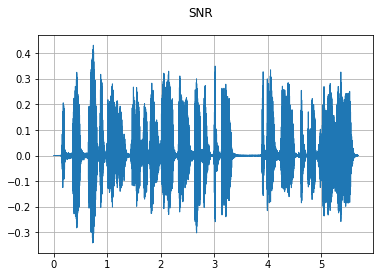

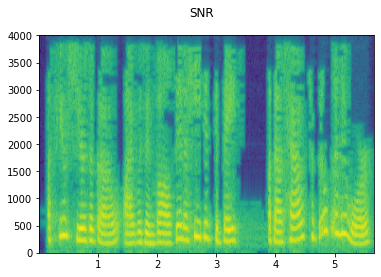

2
3
torch.Size([1, 44676])
torch.Size([1, 32000])


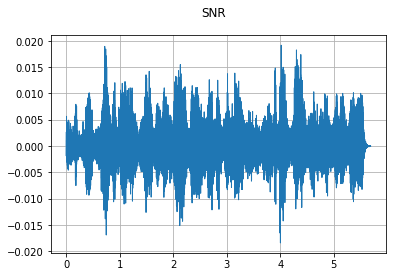

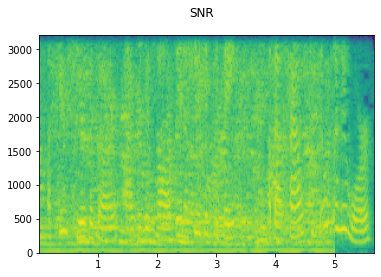

torch.Size([1, 89351])
torch.Size([1, 80000])


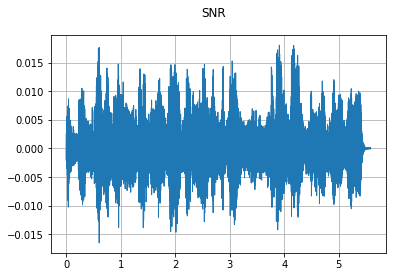

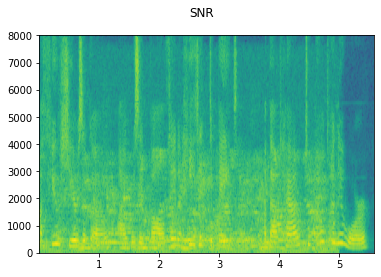

1
2
3
torch.Size([1, 44676])
torch.Size([1, 32000])


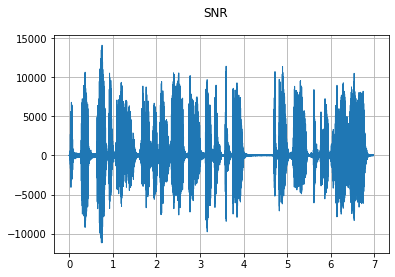

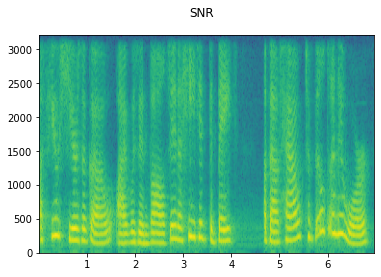

2
4
torch.Size([2, 44676])
torch.Size([1, 40000])


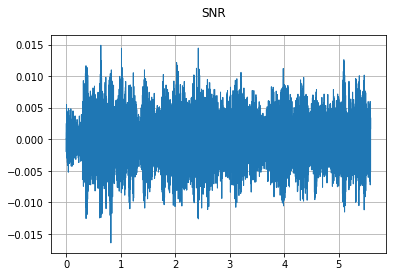

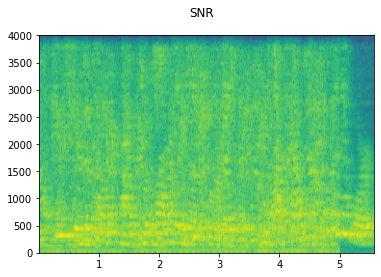

4
torch.Size([2, 89351])
torch.Size([1, 80000])


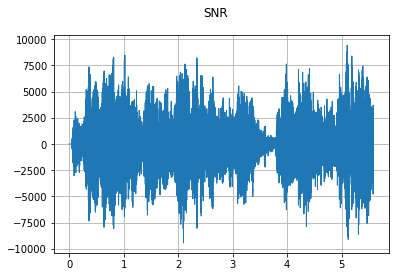

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


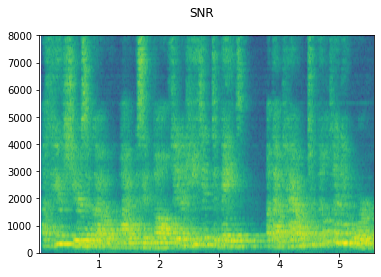

torch.Size([1, 89351])
torch.Size([1, 80000])


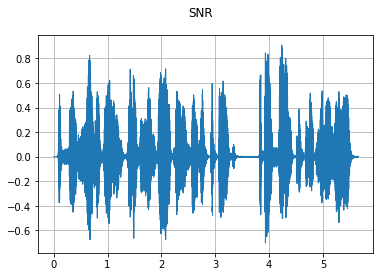

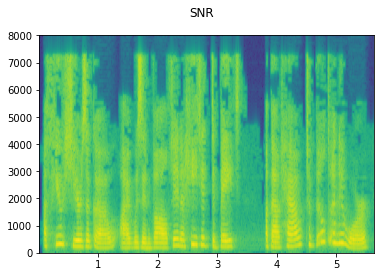

2
3
4
torch.Size([2, 44676])
torch.Size([1, 32000])


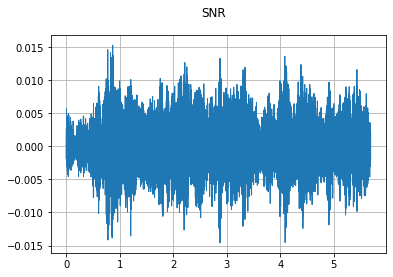

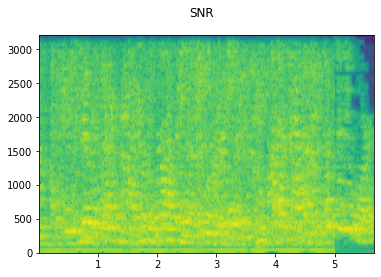

1
2
3
torch.Size([1, 44676])
torch.Size([1, 32000])


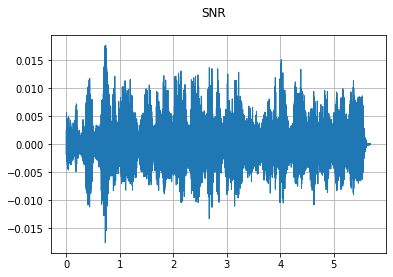

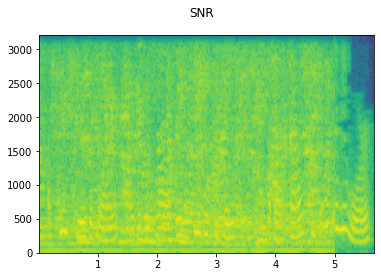

1
torch.Size([1, 89351])
torch.Size([1, 80000])


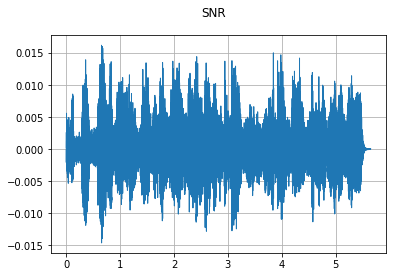

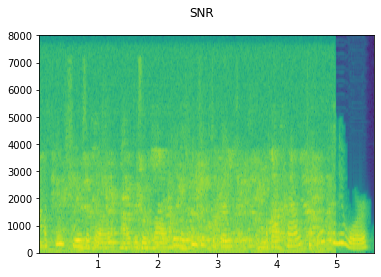

1
2
4
torch.Size([2, 44676])
torch.Size([1, 40000])


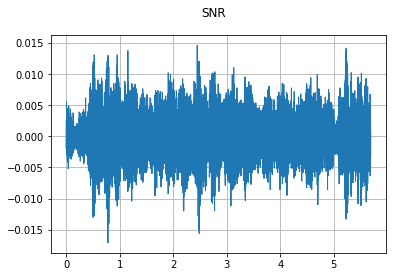

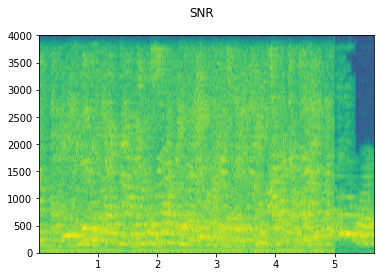

1
3
4
torch.Size([2, 89351])
torch.Size([1, 64000])


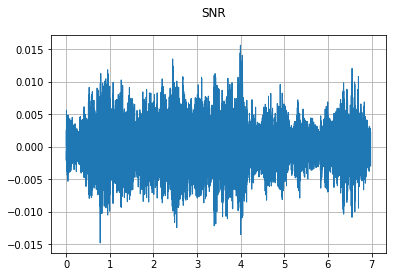

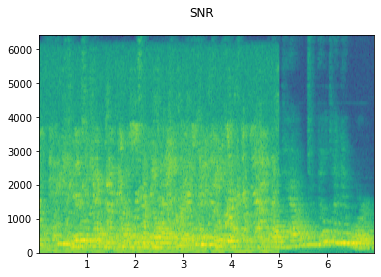

3
4
torch.Size([2, 89351])
torch.Size([1, 64000])


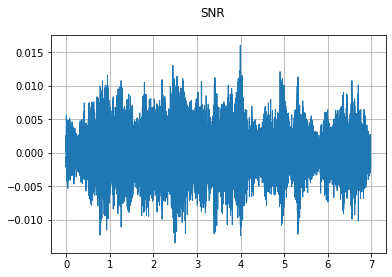

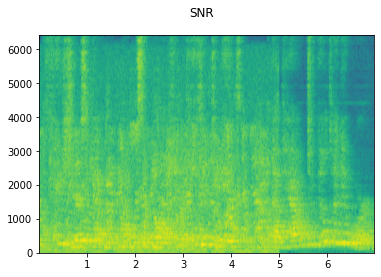

In [ ]:

for i in range(100):
    noisy_speech , sr = get_sample('/content/spcup_2022_unseen/spcup_2022_unseen/00615a0b72ccbd87ef70300563361ff7.wav')
    plot_waveform(noisy_speech, sr, title=f"SNR")
    plot_specgram(noisy_speech, sr, title=f"SNR")

In [ ]:
audio_path = '/content/spcup_2022_unseen/spcup_2022_unseen/00615a0b72ccbd87ef70300563361ff7.wav'

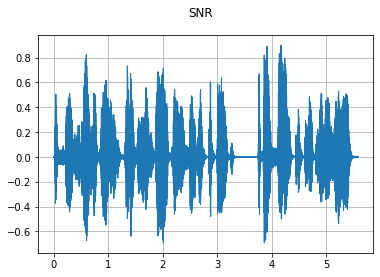

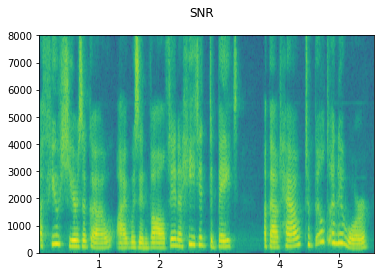

In [ ]:
noisy_speech , sr = torchaudio.sox_effects.apply_effects_file(audio_path, effects=[])
plot_waveform(noisy_speech, sr, title=f"SNR")
plot_specgram(noisy_speech, sr, title=f"SNR")

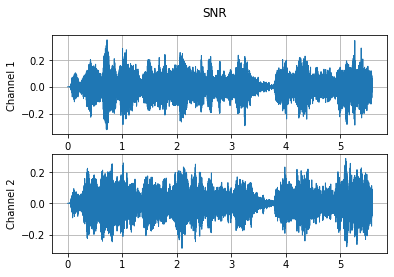

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


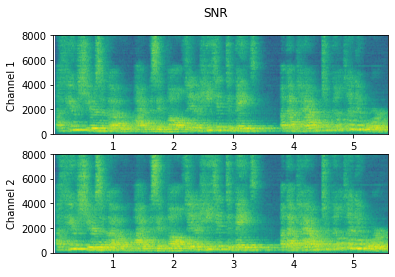

In [ ]:
noisy_speech , sr = torchaudio.sox_effects.apply_effects_file(audio_path, effects=[["reverb", "-w"]])
plot_waveform(noisy_speech, sr, title=f"SNR")
plot_specgram(noisy_speech, sr, title=f"SNR")